## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* **Use color transforms, gradients, etc., to create a thresholded binary image.**
* **Apply a perspective transform to rectify binary image ("birds-eye view").**
* **Detect lane pixels and fit to find the lane boundary.**
* **Determine the curvature of the lane and vehicle position with respect to center.**
* **Warp the detected lane boundaries back onto the original image.**
* **Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.**

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import pickle
def load_data_from_file(filePath, colnames):
    with open(filePath, mode='rb') as f:
        file = pickle.load(f)
    rtn = tuple(map(lambda x:file[x],colnames))
    return rtn

In [3]:
mtx, dist = load_data_from_file('./camera_calibration.p',['mtx','dist'])

In [4]:
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    sobel = cv2.Sobel(gray,cv2.CV_64F,orient=='x',orient=='y',ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sobel_binary

def mag_sobel_thresh(gray, sobel_kernel=3, thresh=(0, 255)):
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return mag_binary

def dir_sobel_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    dir = np.arctan2(abs_sobely,abs_sobelx)
    dir_binary = np.zeros_like(dir)
    dir_binary[(dir > thresh[0]) & (dir <= thresh[1])] = 1
    return dir_binary

In [5]:
def thresh_image(img, thresh=(20, 100)):
    binary = np.zeros_like(img)
    binary[((img > thresh[0]) & (img <= thresh[1]))] = 1
    return binary

In [6]:
def get_region_of_interest():
    bottomY = 720
    topY = 455
    left1 = (190, bottomY)
    left2 = (585, topY)
    right1 = (705, topY)
    right2 = (1130, bottomY)
    
    return np.float32((left2,right1,right2,left1))    

In [7]:
def get_transform_dest(w,h):
    offset = 250
    dst = np.float32([[offset, 0],[w-offset, 0],[w-offset, h], [offset, h]])
    return dst

In [8]:
def get_transform_matrix(src_pts,dest_pts):
    M = cv2.getPerspectiveTransform(src_pts, dest_pts)    
    return M

In [9]:
def perspective_transform(img, M):
    w,h = img.shape[1::-1]
    transed = cv2.warpPerspective(img,M,(w,h),flags=cv2.INTER_LINEAR) 
    return transed

In [25]:
def add_region_of_interest_to_image(src_image,pts):
    left2 = pts[0]
    right1 = pts[1]
    right2 = pts[2]
    left1 = pts[3]

    color = [255, 0, 0]
    w = 2
    output = src_image.copy()
    cv2.line(output, tuple(left1), tuple(left2), color, w)
    cv2.line(output, tuple(left2), tuple(right1), color, w)
    cv2.line(output, tuple(right1), tuple(right2), color, w)
    cv2.line(output, tuple(right2), tuple(left1), color, w)
    
    return output

In [10]:
import matplotlib.image as mpimg

sample_image = mpimg.imread('./test_images/straight_lines2.jpg')

w,h = sample_image.shape[1::-1]
src = get_region_of_interest()
dst = get_transform_dest(w,h)

M = get_transform_matrix(src,dst)
inverseM = get_transform_matrix(dst,src)

import pickle
pickle.dump( { 'M': M, 'inverseM': inverseM }, open('./transform.p', 'wb'))

In [11]:
print(M)
print(inverseM)

[[ -6.05625549e-01  -1.50336947e+00   1.01503076e+03]
 [ -2.88657986e-15  -1.98300615e+00   9.02267800e+02]
 [ -2.16840434e-18  -2.40257838e-03   1.00000000e+00]]
[[  1.53846154e-01  -7.78812057e-01   5.46538462e+02]
 [  4.44089210e-16  -5.04284870e-01   4.55000000e+02]
 [ -2.16840434e-18  -1.21158392e-03   1.00000000e+00]]


In [12]:
import matplotlib.image as mpimg

def pipeline_single_image(rgbimage,ksize=3, s_thresh=(80, 250), sobelx_thresh=(20, 100)):
    # Undistort
    undist_img = cv2.undistort(rgbimage, mtx, dist, None, mtx)
        
    gray = cv2.cvtColor(undist_img,cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS).astype(np.float)

    h_channel = hls[:, :, 0]
#   l_channel = hls[:, :, 1]
    s_channel = hls[:, :, 2]

    s_binary = thresh_image(s_channel,thresh=s_thresh)
    sx_binary = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=sobelx_thresh)

    h_binary = thresh_image(h_channel,thresh=(5,100))
    dir_binary = dir_sobel_threshold(gray,sobel_kernel=ksize,thresh=(0.7,1.3))
    mag_binary = mag_sobel_thresh(gray, sobel_kernel=ksize, thresh=(30, 100))

    sh_binary = np.zeros_like(gray)
    sh_binary[(s_binary == 1) & (h_binary == 1)] = 1

    combined_binary = np.zeros_like(gray)
#   combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
    combined_binary[(sh_binary == 1) | (sx_binary == 1)] = 1
#   combined_binary[((s_binary == 1) & (sx_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    # perspective transform
    w,h = rgbimage.shape[1::-1]
    src = get_region_of_interest()
    dst = get_transform_dest(w,h)
    M = get_transform_matrix(src,dst)
    trans_binary = perspective_transform(combined_binary,M)
    
    return trans_binary,combined_binary,s_binary,h_binary,sh_binary,sx_binary

In [22]:
import matplotlib.image as mpimg

def pipeline_image_paths_set(image_files_set,ksize=3, s_thresh=(80, 250), sobelx_thresh=(20, 100)):
    image_set = []
    trans_set = []
    combined_set = []
    shinary_set = []
    sxbinary_set = []
    for image_file_path in image_files_set:
        rgbimg = mpimg.imread(image_file_path)
        tr_bin,comb_bin,s_bin,h_bin,sh_bin,sx_bin = pipeline_single_image(rgbimg,ksize,s_thresh,sobelx_thresh)
        image_set.append(rgbimg)
        trans_set.append(tr_bin)
        combined_set.append(comb_bin)
        shinary_set.append(sh_bin)
        sxbinary_set.append(sx_bin)
    
    return list(zip(image_set,trans_set,combined_set,shinary_set,sxbinary_set))

In [23]:
def show_image_set(image_files, dataset_zip, titles, col_per_row = 5):
    for file_name,item in zip(image_files,dataset_zip):
        img,tr_bin,c_bin,s_bin,sx_bin = item
        
        fig = plt.figure(figsize = (32, 12))
        fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.01, wspace = 0.01)
        
        pts = get_region_of_interest()
        img = add_region_of_interest_to_image(img,pts)

        plt.subplot(1,col_per_row,1)
        plt.imshow(img)
        plt.title(file_name,fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,2)
        plt.imshow(tr_bin,cmap='gray')
        plt.title(titles[0],fontsize=20)
        plt.axis('off')       

        plt.subplot(1,col_per_row,3)
        plt.imshow(c_bin,cmap='gray')
        plt.title(titles[1],fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,4)
        plt.imshow(s_bin,cmap='gray')
        plt.title(titles[2],fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,5)
        plt.imshow(sx_bin,cmap='gray')
        plt.title(titles[3],fontsize=20)
        plt.axis('off')

In [13]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30 / 720  # meters per pixel in y dimension
xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

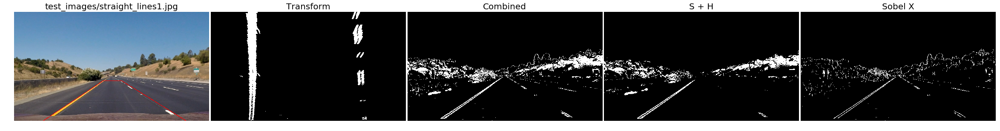

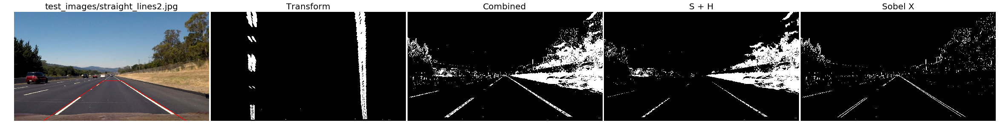

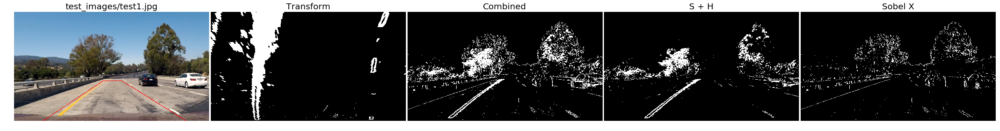

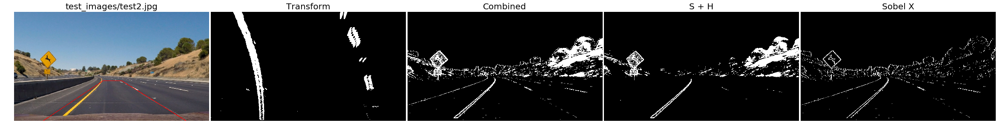

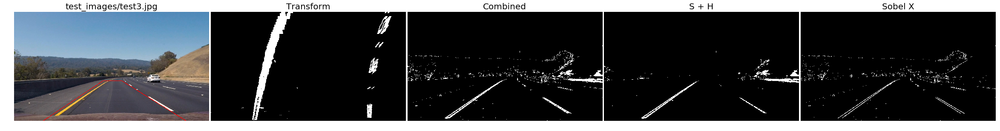

...

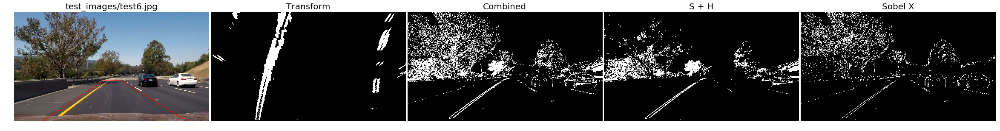

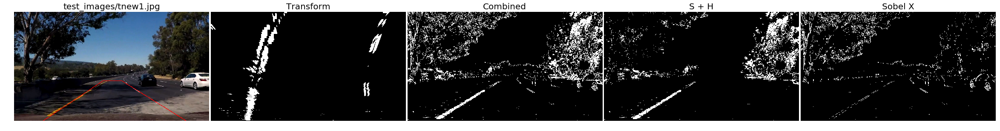

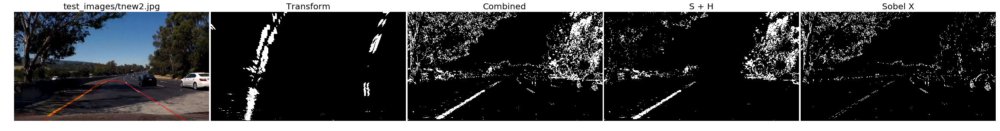

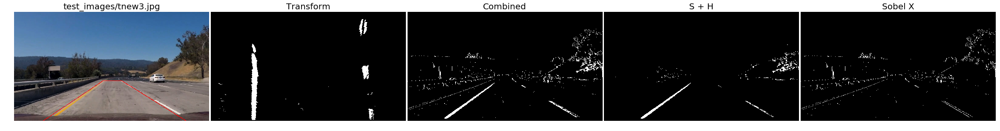

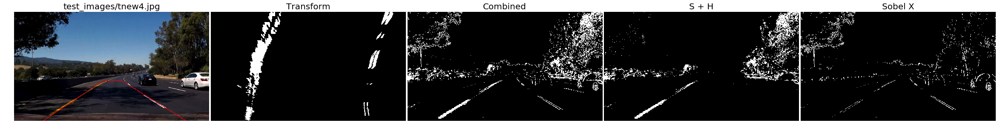

In [26]:
import glob

titles = ['Transform','Combined','S + H','Sobel X']

image_files_names = glob.glob('test_images/*.jpg')
# image_files_names = glob.glob('harder_test/0-*.jpg')

dataset_zip = pipeline_image_paths_set(image_files_names,ksize=3, s_thresh=(80, 250), sobelx_thresh=(30, 150))

image_set = []
trans_set = []
combined_set = []
sbinary_set = []
sxbinary_set = []

for img,tr_bin,c_bin,s_bin,sx_bin in dataset_zip:
    image_set.append(img)
    trans_set.append(tr_bin)
    combined_set.append(c_bin)
    sbinary_set.append(s_bin)
    sxbinary_set.append(sx_bin)

# print(len(trans_set))
show_image_set(image_files_names,dataset_zip,titles)
# show_images(trans_set,image_files_names,cmap='gray')

# for ind in range(len(combined_set)):
#     mpimg.imsave('./{}.jpg'.format(ind+1),combined_set[ind])

# test1_set = combined_set
# index = 0
# showi = test1_set[index]*255
# mpimg.imsave('./1.jpg',test1_set[])
# mpimg.imsave('./2.jpg',test1_set[5])
# mpimg.imsave('./3.jpg',showi)
# mpimg.imsave('./4.jpg',test1_set[7])

# w,h = showi.shape[1::-1]
# src = get_region_of_interest()
# dst = get_transform_dest(w,h)
# M = get_transform_matrix(src,dst)

# showi_trans = perspective_transform(showi,M)

# plt.imshow(showi,cmap='gray')


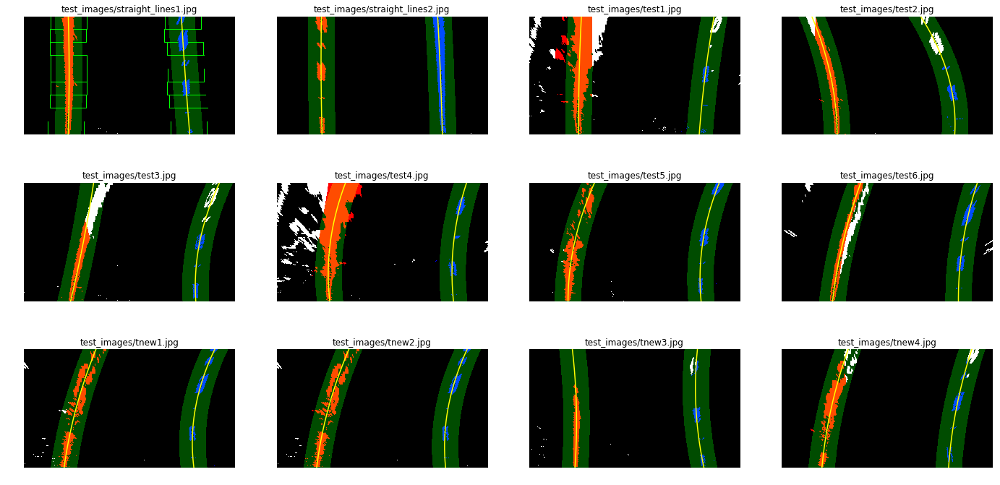

In [27]:
# show_images(combined_set)
# print(image_files_names)
imagefit_set = find_and_show_lane_lines_rgb_image_set(image_set,image_files_names,cols=4,rows=3,figsize=(24,12))

In [14]:
def find_lane_on_single_rgb_image(rgbimage, nwindows=9, margin=110, minpix=50, left_fit=None, right_fit=None):

    binary_warped,_,_,_,_,_ = pipeline_single_image(rgbimage,ksize=3, s_thresh=(80, 250), sobelx_thresh=(30, 150))

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if (left_fit is None) | (right_fit is None):
        left_lane_inds, right_lane_inds = sliding_window_search(binary_warped,out_img,nonzerox,nonzeroy,nwindows,margin,minpix)
    else:
        left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] - margin))
                          & (nonzerox < (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))

        right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] - margin))
                           & (nonzerox < (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))


    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Fit a second order polynomial to each
    left_fit_m = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_m = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)

    return (left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy)

def visualize_lane_lines_single_rgb_image(rgbimage,ax,lfit=None,rfit=None):
    left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy = find_lane_on_single_rgb_image(rgbimage,left_fit=lfit,right_fit=rfit)
    # Visualization
    ploty = np.linspace(0, rgbimage.shape[0]-1, rgbimage.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = 80
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    window_img = np.zeros_like(out_img)
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ax.imshow(result)
    
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    return ( left_fit, right_fit, left_fit_m, right_fit_m)

def find_and_show_lane_lines_rgb_image_set(rgbimage_set,file_path_set,cols = 2, rows = 3, figsize=(15,13)):
    nums = len(rgbimage_set)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    plt.axis('off')
    indexes = range(cols * rows)
    imagefit_set = []

    lfit = None
    rfit = None

    for ax, index in zip(axes.flat, indexes):
        if index < nums:
            rgbimage = rgbimage_set[index]
            path = file_path_set[index]
            left_fit, right_fit, left_fit_m, right_fit_m = visualize_lane_lines_single_rgb_image(rgbimage, ax,lfit=lfit,rfit=rfit)
            lfit = left_fit
            rfit = right_fit
            ax.set_title(path)
            ax.axis('off')
            imagefit_set.append( ( path, left_fit, right_fit, left_fit_m, right_fit_m ) )
    return imagefit_set    


In [15]:
def sliding_window_search(binary_warped,out_img,nonzerox,nonzeroy,nwindows=9, margin=110, minpix=50):
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] // nwindows)

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (
        nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (
        nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    return (left_lane_inds, right_lane_inds)

In [16]:
def calculate_curvature(yRange, left_fit_cr):
    return ((1 + (2*left_fit_cr[0]*yRange*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])

In [28]:
for imgfit in imagefit_set:
    path, left_fit, right_fit, left_fit_m, right_fit_m = imgfit
    leftCurvature = calculate_curvature(719, left_fit_m) / 1000
    rightCurvature = calculate_curvature(719, right_fit_m) / 1000
    print('{}, Left - {:.2f} km, Right - {:.2f} km'.format(path, leftCurvature, rightCurvature))

test_images/straight_lines1.jpg, Left - 3.74 km, Right - 10.48 km
test_images/straight_lines2.jpg, Left - 6.02 km, Right - 8.51 km
test_images/test1.jpg, Left - 4.23 km, Right - 2.32 km
test_images/test2.jpg, Left - 0.58 km, Right - 0.34 km
test_images/test3.jpg, Left - 2.72 km, Right - 0.44 km
test_images/test4.jpg, Left - 0.48 km, Right - 0.55 km
test_images/test5.jpg, Left - 0.53 km, Right - 0.48 km
test_images/test6.jpg, Left - 0.95 km, Right - 0.71 km
test_images/tnew1.jpg, Left - 0.87 km, Right - 0.39 km
test_images/tnew2.jpg, Left - 0.78 km, Right - 0.42 km
test_images/tnew3.jpg, Left - 1.27 km, Right - 0.75 km
test_images/tnew4.jpg, Left - 0.90 km, Right - 0.91 km


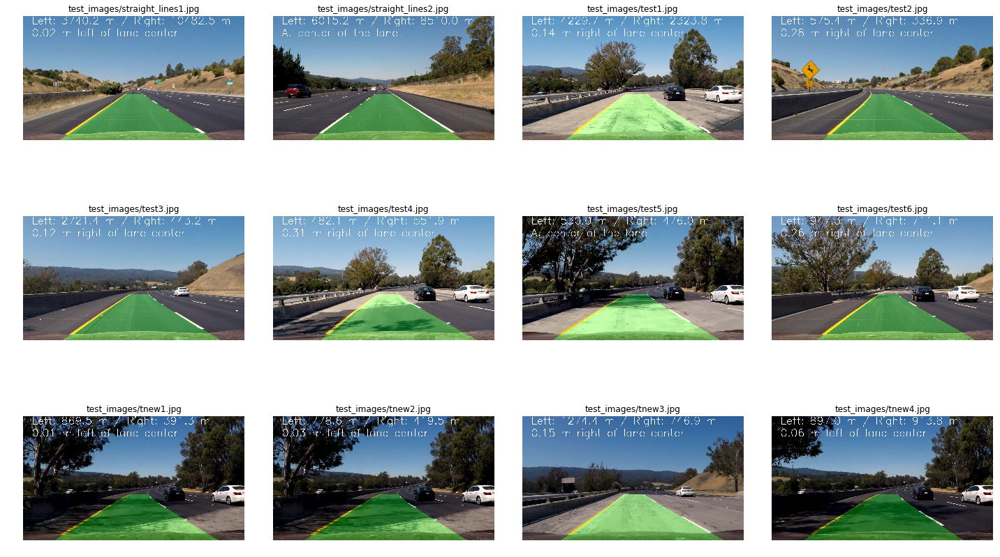

In [32]:
lanes_set = []
for image_fit,img in zip(imagefit_set,image_set):
    _, left_fit, right_fit, left_fit_m, right_fit_m = image_fit
    image_with_lane = draw_lane_area_on_image(img,left_fit,right_fit)
    image_with_lane = draw_lane_info_on_image(image_with_lane,left_fit_m,right_fit_m)
    lanes_set.append(image_with_lane)

show_images(lanes_set,image_files_names)

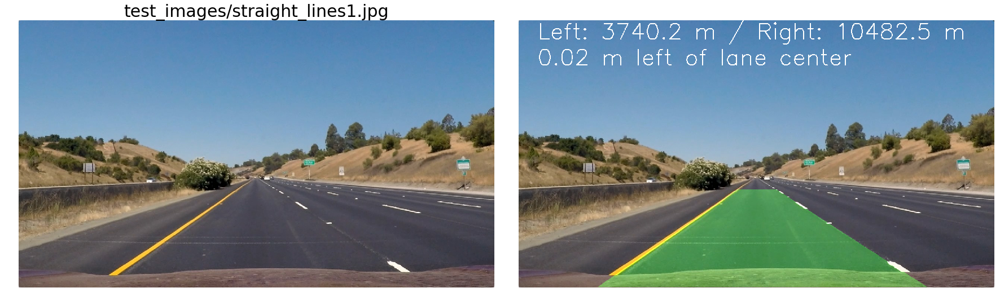

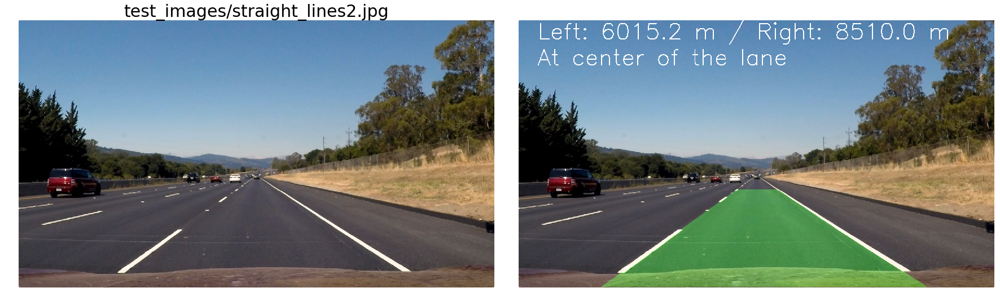

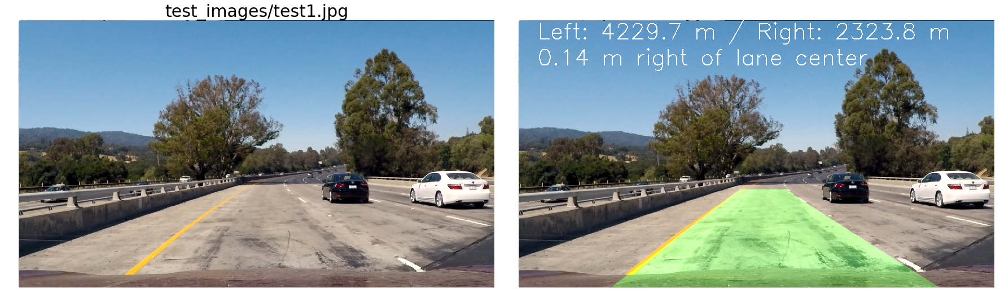

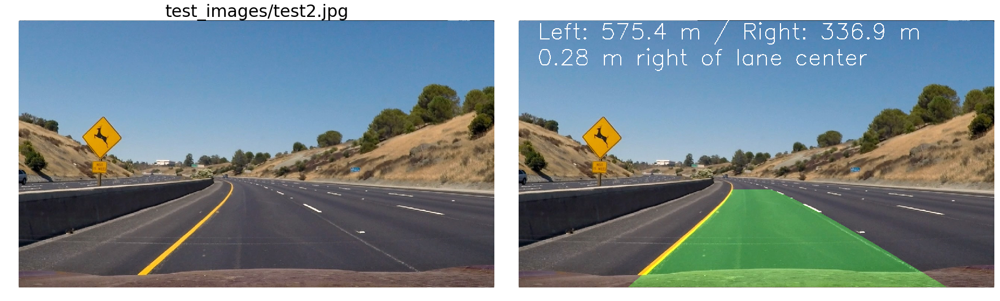

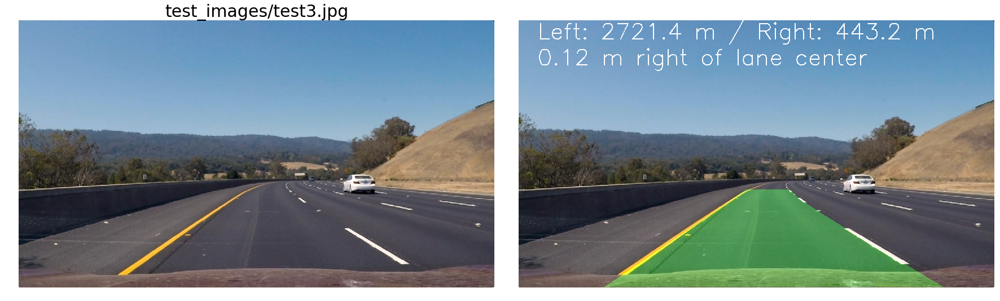

...

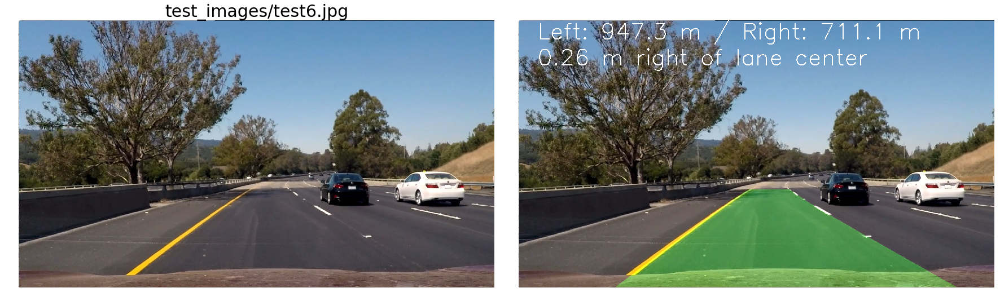

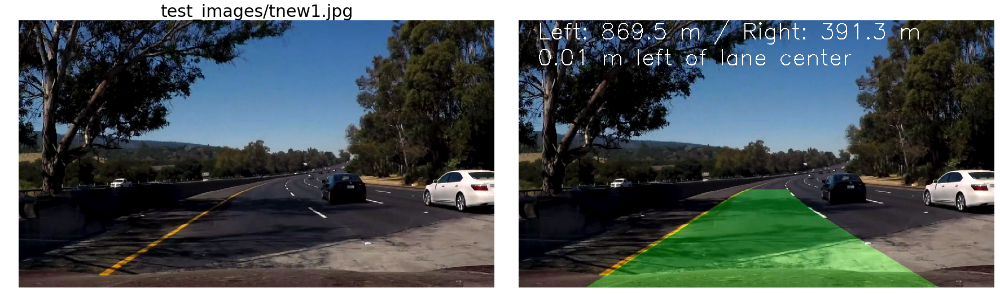

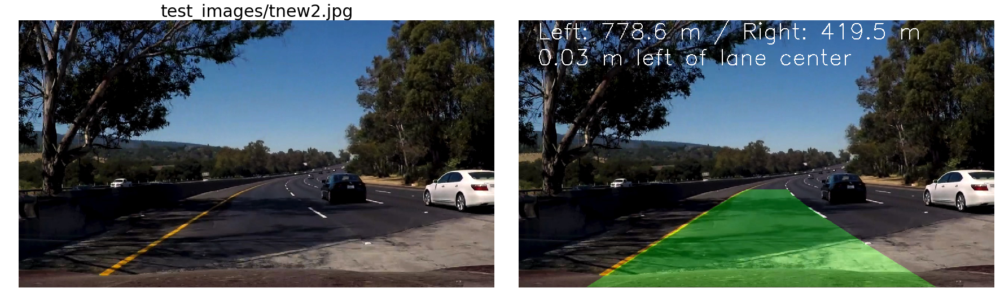

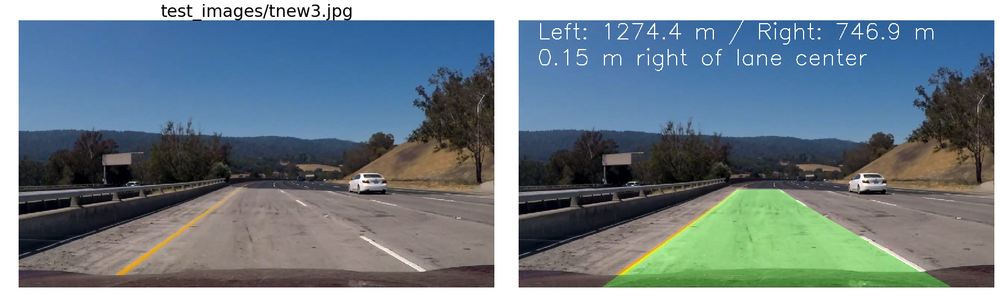

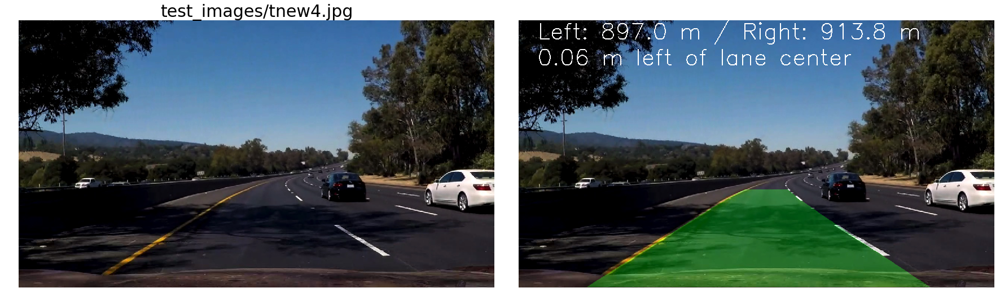

In [33]:
for org,lane,name in zip(image_set,lanes_set,image_files_names):
    show_2_images_side_by_side(org,lane,name,'',cmap1=None, cmap2=None)

In [20]:
def draw_lane_area_on_image(img,l_fit,r_fit):

    yMax = img.shape[0]
    ploty = np.linspace(0, yMax - 1, yMax)
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    # Calculate points.
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (inverseM)
    newwarp = cv2.warpPerspective(color_warp, inverseM, (img.shape[1], img.shape[0])) 
    output = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return output 

def draw_lane_info_on_image(img, l_fit_m, r_fit_m,fontScale=2):
    output = img.copy()
    # Calculate curvature
    leftCurvature = calculate_curvature(719, l_fit_m) 
    rightCurvature = calculate_curvature(719, r_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    middle = xMax / 2
    
    lineLeft = l_fit_m[0]*yMax**2 + l_fit_m[1]*yMax + l_fit_m[2]
    lineRight = r_fit_m[0]*yMax**2 + r_fit_m[1]*yMax + r_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    
    diff = lineMiddle - middle
    if diff > 0.01:
        message = '{:.2f} m right of lane center'.format(diff)
    elif diff < -0.01:
        message = '{:.2f} m left of lane center'.format(-diff)
    else:
        message = 'At center of the lane'
    
    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left: {:.1f} m / Right: {:.1f} m'.format(leftCurvature,rightCurvature), (50, 50), font, fontScale, fontColor, 2)
    cv2.putText(output, message, (50, 120), font, fontScale, fontColor, 2)
    
    return output

In [30]:
def show_images(image_set, title_set=None,counts=None,cmap=None):
    num_image_toshow = len(image_set) if counts is None else counts
    plt.figure(1, figsize=(20, 36))
    for idx in range(num_image_toshow):
        plt.subplot(9,4, idx + 1)
        img = image_set[idx]
        if img.shape[0] >0:
            if cmap is 'gray':
                plt.imshow(img,cmap='gray')
            else:
                plt.imshow(img)
        if title_set is not None:
            s = '{}'.format(title_set[idx])
            plt.title(s)
        plt.axis('off')
        plt.tight_layout()

In [31]:
def show_2_images_side_by_side(img1, img2, title1='',title2='',cmap1=None,cmap2='gray'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if cmap1 == None:
        ax1.imshow(img1)
    else:
        ax1.imshow(img1,cmap=cmap1)
    ax1.set_title(title1, fontsize=30)
    ax1.axis('off')
    if cmap2 == None:
        ax2.imshow(img2)
    else:
        ax2.imshow(img2, cmap=cmap2)
    ax2.set_title(title2, fontsize=30)
    ax2.axis('off')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Video Processing

In [21]:
from moviepy.editor import VideoFileClip

class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.left_fit_m = None
        self.right_fit_m = None
        self.left_curvature = None
        self.right_curvature = None

def find_lanes_and_calculate_curvatures(img,l_fit=None,r_fit=None):
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = find_lane_on_single_rgb_image(img,margin=110,left_fit=l_fit,right_fit=r_fit)
    # Calculate curvature
    left_curvature = calculate_curvature(719, left_fit_m) 
    right_curvature = calculate_curvature(719, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diff = lineMiddle - vehicleCenter
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, left_curvature, right_curvature, diff)

def visualize_lanes(img, left_fit, right_fit, left_fit_m, right_fit_m, left_curvature, right_curvature, diff):
    output = draw_lane_area_on_image(img, left_fit, right_fit)

    if diff > 0.01:
        message = '{:.2f} m right of lane center'.format(diff)
    elif diff < -0.01:
        message = '{:.2f} m left of lane center'.format(-diff)
    else:
        message = 'At center of the lane'

    # Draw info
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left: {:.1f} m / Right: {:.1f} m'.format(left_curvature, right_curvature), (50, 50), font,
                1, fontColor, 2)
    cv2.putText(output, message, (50, 120), font, 1, fontColor, 2)
    
    return output
    
def video_pipeline(input, output):
    myclip = VideoFileClip(input)
    
    leftLane = Lane()
    rightLane = Lane()
    
    def processImage(img):
        new_left_fit, new_right_fit, left_fit_m, right_fit_m, left_curvature, right_curvature, diff = find_lanes_and_calculate_curvatures(img,l_fit=leftLane.left_fit,r_fit=rightLane.right_fit)
        leftLane.left_fit = new_left_fit
        leftLane.left_fit_m = left_fit_m
        leftLane.left_curvature = left_curvature
        rightLane.right_fit = new_right_fit
        rightLane.right_fit_m = right_fit_m
        rightLane.right_curvature = right_curvature
            
        return visualize_lanes(img, new_left_fit, new_right_fit, left_fit_m, right_fit_m, left_curvature, right_curvature, diff)

    clip = myclip.fl_image(processImage)
    clip.write_videofile(output, audio=False)

# Project video
video_pipeline('project_video.mp4', 'out_project_video.mp4')

[MoviePy] >>>> Building video out_project_video.mp4
[MoviePy] Writing video out_project_video.mp4


100%|█████████▉| 1260/1261 [06:36<00:00,  3.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_project_video.mp4 



In [35]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('out_project_video.mp4'))